In [1]:
import os
import numpy as np
import pandas as pd
from scripts.data import load_2D_data
from monai.transforms import ScaleIntensity
import matplotlib.pyplot as plt
import matplotlib.colors

from scripts.train import LitUnet 


/home/ids/mahdi-22/M-M/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Functions

In [9]:
def plot_examples(subject_ids, model_name, centres, step = 10):

    # define the load transform
    load_transform = ScaleIntensity(minv=0.0, maxv=1.0, channel_wise=True)


    # load data of these subject ids
    images, labels, subject_volume_sizes = load_2D_data(transform=load_transform, subject_ids=subject_ids)

    slices = [list(range(1, size[0]+1)) for size in subject_volume_sizes]
    titles = [f"Centre {centre} Subject {id} Slice {slice}" for (sublist, id, centre) in zip(slices, subject_ids, centres) for slice in sublist]



    images = images[::step]
    labels = labels[::step]
    titles = titles[::step]

    model = LitUnet.load_from_checkpoint(f"models/{model_name}/{model_name}.ckpt")
    model.eval()
    exec(open('archiv_config/' + model_name + '.py').read())

    # make predictions
    predictions = model._get_predictions(images)


    fig, axis = plt.subplots(len(images), 5, figsize=(20, len(images)*4))

    color_palette = ["purple", "tab:blue", "limegreen", "yellow"]
    color_map = matplotlib.colors.ListedColormap(color_palette)
    # for every image in images plot the histogram of intensity values for each region in the labels 
    for i in range(len(images)):
        # get the image and label
        image = images[i][0]
        label = labels[i][0]
        prediction = predictions[i]
        title = titles[i]
        
        # get the regions in the label
        regions =np.unique(label)
        
        # plot the normalized histogram of the image for each region
        for region in regions:

            # get the image for the region
            image_region = image[label == region]

            # plot the histogram normalized
            axis[i, 2].hist(image_region, bins=30, density=True, alpha=0.5 ,label=f"Region {int(region)}", color=color_palette[int(region)])
        
        # get the regions in the prediction
        regions =np.unique(predictions)
        
        # plot the normalized histogram of the image for each region
        for region in regions:

            # get the image for the region
            image_region_predicted = image[prediction == region]

            # plot the histogram normalized
            axis[i, 4].hist(image_region_predicted, bins=30, density=True, alpha=0.5 , color=color_palette[int(region)])

        axis[i, 2].set_xlim(xmin=0., xmax=1.)
        axis[i, 4].set_xlim(xmin=0., xmax=1.)


        # plot the image
        axis[i, 0].imshow(image, cmap='gray')
        axis[i, 1].imshow(label, cmap=color_map, vmin=0, vmax=3)
        axis[i, 3].imshow(prediction, cmap=color_map, vmin=0, vmax=3)


        # set the title
        axis[i, 0].set_title(title)

        if i==0 : fig.legend()
        

    # title for the fig
    fig.suptitle(f"Model: {model_name}")

    plt.tight_layout()
    plt.show()


In [10]:
models = sorted([name for name in os.listdir('models') if os.path.isdir(os.path.join('models', name))])
print(models)

['DiceLoss', 'all_transforms', 'benchmark', 'improved_transforms', 'intensity_w_bias', 'intensity_w_bias_gamma', 'simple_intensity', 'simple_spatial', 'simple_spatial_bigger_batch', 'simple_spatial_intensity', 'simple_spatial_lower_lr', 'simple_spatial_smaller_batch', 'simple_spatial_with_blur', 'simple_spatial_with_gaussian_smooth', 'spatial_w_T00_R02', 'spatial_w_T00_R03', 'spatial_w_T05_R01', 'spatial_w_T10_R02', 'spatial_w_T15_R03', 'spatial_w_elastic']


In [11]:
model_name = 'DiceLoss'
results = pd.read_csv('models/' + model_name + '/results.csv')[['SubjectID', 'Centre', 'Dice_LV_ED', 'Dice_MYO_ED',
    'Dice_RV_ED', 'Dice_LV_ES', 'Dice_MYO_ES', 'Dice_RV_ES']]
exec(open('archiv_config/' + model_name + '.py').read())


In [12]:
# get the results where the dice score is less than 0.5 in any of the dice columns 
thresh = 0.3
bad_results = results[(results['Dice_LV_ED'] < thresh) | (results['Dice_MYO_ED'] < thresh) | (results['Dice_RV_ED'] < thresh) | (results['Dice_LV_ES'] < thresh) | (results['Dice_MYO_ES'] < thresh) | (results['Dice_RV_ES'] < thresh)]
print(bad_results)

# get the subject ids of the results
subject_ids = list(bad_results['SubjectID'].values)
centres = list(bad_results['Centre'].values)

len(subject_ids)

    SubjectID  Centre  Dice_LV_ED  Dice_MYO_ED  Dice_RV_ED  Dice_LV_ES  \
222    D3K5Q2       4    0.145401     0.156733    0.512606    0.078400   
267    B6I0T4       5    0.777722     0.612536    0.109393    0.636289   
272    D1S5T8       5    0.771617     0.378155    0.719271    0.628156   

     Dice_MYO_ES  Dice_RV_ES  
222     0.085030    0.344634  
267     0.441479    0.057861  
272     0.233163    0.561611  


3

Loading Images for centre:  1
Loading Labels for centre:  1


100%|██████████| 3/3 [00:00<00:00, 37.93File/s]


/home/ids/mahdi-22/M-M/.venv/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


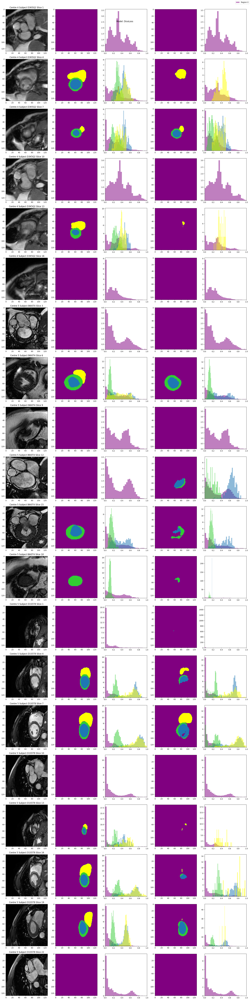

In [13]:
plot_examples(subject_ids, model_name, centres=centres, step=len(subject_ids))

In [14]:
# get the results where the dice score is above thresh in all of the dice columns 
thresh = 0.78
good_results = results[(results['Dice_LV_ED'] > thresh) & (results['Dice_MYO_ED'] > thresh) & (results['Dice_RV_ED'] > thresh) & (results['Dice_LV_ES'] > thresh) & (results['Dice_MYO_ES'] > thresh) & (results['Dice_RV_ES'] > thresh) & (results['Centre']!=0)]

print(good_results)

# get the subject ids of the results
subject_ids = list(good_results['SubjectID'].values)
centres = list(good_results['Centre'].values)

len(subject_ids)

    SubjectID  Centre  Dice_LV_ED  Dice_MYO_ED  Dice_RV_ED  Dice_LV_ES  \
80     F3G5K5       1    0.968256     0.887831    0.928450    0.938464   
84     J6P5T8       1    0.971419     0.882443    0.926885    0.944426   
140    I6N3P3       2    0.960211     0.882309    0.931891    0.923467   

     Dice_MYO_ES  Dice_RV_ES  
80      0.798288    0.866456  
84      0.789618    0.863733  
140     0.789403    0.872469  


3

Loading Images for centre:  1
Loading Labels for centre:  1


100%|██████████| 3/3 [00:00<00:00, 40.25File/s]


/home/ids/mahdi-22/M-M/.venv/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


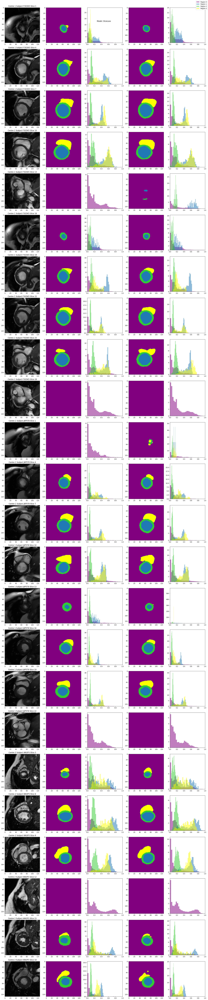

In [15]:
plot_examples(subject_ids, model_name, centres=centres, step=len(subject_ids))

Loading Images for centre:  1
Loading Labels for centre:  1


100%|██████████| 1/1 [00:00<00:00, 39.40File/s]


/home/ids/mahdi-22/M-M/.venv/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


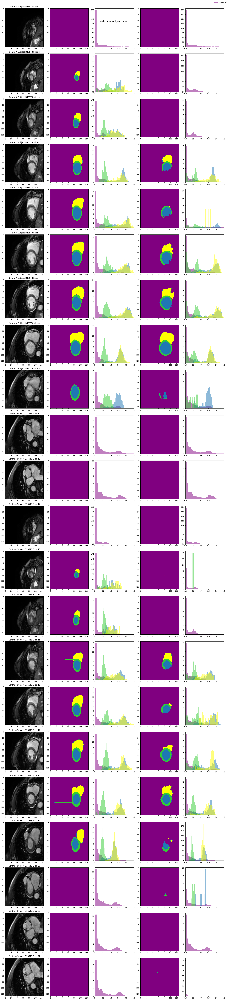

In [ ]:
plot_examples(["D1S5T8"], model_name, centres=[4], step=1)

In [16]:
from monai import transforms
TRANSFORM = transforms.Compose(
    [
        transforms.RandFlipd(keys=("img", "seg"), prob=0.5, spatial_axis=[1]),
        transforms.RandFlipd(keys=("img", "seg"), prob=0.5, spatial_axis=[0]),
        transforms.RandAffined(
            keys=["img", "seg"],
            padding_mode="constant",
            translate_range=(10, 10),
            mode=[5, "nearest"],
            prob=0.7,
        ),
        transforms.RandZoomd(
            keys=["img", "seg"],
            min_zoom=0.9,
            max_zoom=1.1,
            prob=0.5,
            mode="nearest-exact",
            padding_mode="constant",
        ),

    ]
)

Loading Images for centre:  1
Loading Labels for centre:  1


100%|██████████| 27/27 [00:00<00:00, 34.74File/s]


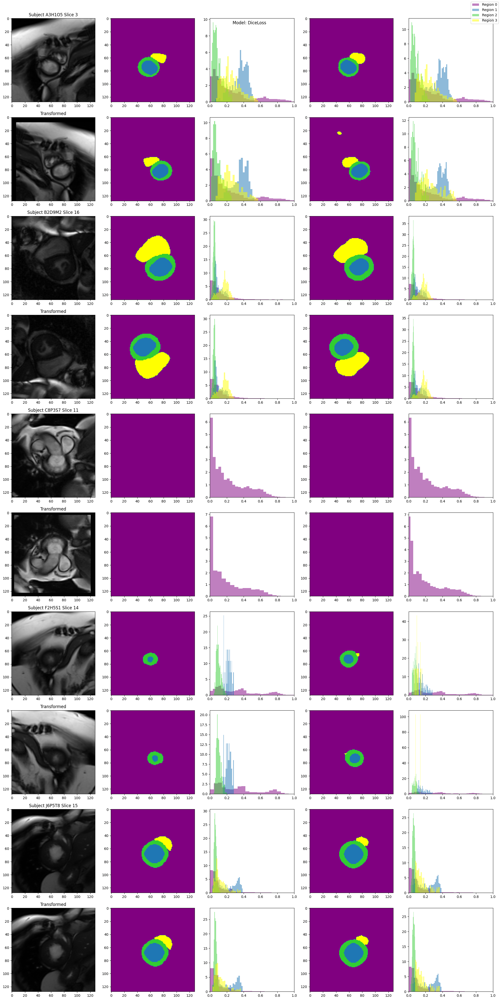

In [18]:
# get the results for the centre 0
training_results = results[results['Centre'] == 1]

# get the subject ids of the results
subject_ids = list(training_results['SubjectID'].values)


# print results of these subject ids
# print(results[results['SubjectID'].isin(subject_ids)])

model = LitUnet.load_from_checkpoint(f"models/{model_name}/{model_name}.ckpt")


# define the load transform
load_transform = ScaleIntensity(minv=0.0, maxv=1.0, channel_wise=True)


# load data of these subject ids
images, labels, subject_volume_sizes = load_2D_data(transform=load_transform, subject_ids=subject_ids)

slices = [list(range(1, size[0]+1)) for size in subject_volume_sizes]
titles = [f"Subject {id} Slice {slice}" for (sublist, id) in zip(slices, subject_ids) for slice in sublist]


step = 125

images = images[2::step]
labels = labels[2::step]
titles = titles[2::step]


fig, axis = plt.subplots(len(images)*2, 5, figsize=(20, 2*len(images)*4))

color_palette = ["purple", "tab:blue", "limegreen", "yellow"]
color_map = matplotlib.colors.ListedColormap(color_palette)
# for every image in images plot the histogram of intensity values for each region in the labels 
for i in range(len(images)):

    image = images[i][0]
    label = labels[i][0]

    # make predictions
    model.eval()
    predictions = model._get_predictions(images[i].unsqueeze(0))

    prediction = predictions[0]


    keys = {"img":images[i], "seg":labels[i]}

    transformed = TRANSFORM(keys)

    # get the image and label
    transformed_image = transformed["img"][0]
    transformed_label = transformed["seg"][0]

    # make predictions
    predictions = model._get_predictions(transformed["img"].unsqueeze(0))

    transformed_prediction = predictions[0]
    
    title = titles[i]
    
    # get the regions in the label
    regions =np.unique(transformed_label)
    
    # plot the normalized histogram of the image for each region
    for region in regions:

        # get the image for the region
        image_region = transformed_image[transformed_label == region]

        # plot the histogram normalized
        axis[2*i+1, 2].hist(image_region, bins=20, density=True, alpha=0.5 ,label=f"Region {int(region)}", color=color_palette[int(region)])

        # get the image for the region
        image_region = image[label == region]

        # plot the histogram normalized
        axis[2*i, 2].hist(image_region, bins=30, density=True, alpha=0.5, color=color_palette[int(region)])


    # get the regions in the prediction
    regions =np.unique(predictions)
    
    # plot the normalized histogram of the image for each region
    for region in regions:
        # get the image for the region
        image_region_predicted = image[prediction == region]

        # plot the histogram normalized
        axis[2*i, 4].hist(image_region_predicted, bins=30, density=True, alpha=0.5 , color=color_palette[int(region)])

        # get the image for the region
        image_region_predicted = transformed_image[transformed_prediction == region]

        # plot the histogram normalized
        axis[2*i+1, 4].hist(image_region_predicted, bins=30, density=True, alpha=0.5 , color=color_palette[int(region)])


    axis[2*i, 2].set_xlim(xmin=0., xmax=1.)
    axis[2*i, 4].set_xlim(xmin=0., xmax=1.)

    axis[2*i+1, 2].set_xlim(xmin=0., xmax=1.)
    axis[2*i+1, 4].set_xlim(xmin=0., xmax=1.)


    # plot the image
    axis[2*i+1, 0].imshow(transformed_image, cmap='gray')
    axis[2*i+1, 1].imshow(transformed_label, cmap=color_map, vmin=0, vmax=3)
    axis[2*i+1, 3].imshow(transformed_prediction, cmap=color_map, vmin=0, vmax=3)

    # plot the image
    axis[2*i, 0].imshow(image, cmap='gray')
    axis[2*i, 1].imshow(label, cmap=color_map, vmin=0, vmax=3)
    axis[2*i, 3].imshow(prediction, cmap=color_map, vmin=0, vmax=3)


    # set the title
    axis[2*i, 0].set_title(title)
    axis[2*i+1, 0].set_title("Transformed")

    if i==0 : fig.legend()
    

# title for the fig
fig.suptitle(f"Model: {model_name}")

plt.tight_layout()

plt.show()